In [1]:
# import sys
# sys.path.append('../')
# sys.path.append('/Users/sdbykov/work/my_packages/nway')
# import nway_python_api as nway


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
#set 500 columns for pd
pd.set_option('display.max_columns', 500)

if 'sdbykov' in os.getcwd():
    data_path = '/Users/sdbykov/work/lockman_hole/0_data/'
else:
    data_path = 'data/'

%matplotlib inline

# Viewer functions

In [3]:
from astropy.wcs import WCS
from astropy.visualization.wcsaxes import SphericalCircle
from astropy.io import fits
from astropy import units as u
from PIL import Image
import requests
import PIL.ImageOps as pops
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy import coordinates


from astroquery.simbad import Simbad
customSimbad = Simbad()
# https://github.com/astropy/astroquery/blob/main/astroquery/simbad/data/votable_fields_dict.json
customSimbad.add_votable_fields(
    'distance_result', 'ra(d)', 'dec(d)',
    'otype', 'otype(V)', 'otype(S)', 'plx',
    'pmra', 'pmdec', 'plx_error'
    )




def desi_image_cutout(
    ero_id: str,
    ero_cat: pd.DataFrame, 
    desi_matched: pd.DataFrame,
    csc_matched: pd.DataFrame,
    xmm_matched: pd.DataFrame,
    nway_all_candidates: pd.DataFrame,
    jpeg: bool = True,
    search_rad_factor: float = 2,
    savefig: bool = True,):
    """
    Return cutout of DESI image around (`ero_ra`, `ero_dec`)
    
    Obtaining Images and Raw Data:
    https://www.legacysurvey.org/dr9/description/


    Parameters
    ----------
    ero_id : str
        id of the eROSITA object
    ero_cat : pd.DataFrame
        eROSITA catalog (with NWAY data)
    desi_matched : pd.DataFrame
        DESI cat matched to eROSITA
    csc_matched : pd.DataFrame
        CSC cat matched to eROSITA
    xmm_matched : pd.DataFrame
        XMM cat matched to eROSITA
    nway_all_candidates : pd.DataFrame
        NWAY data of all candidate counterparts
    jpeg : bool, optional
        If True, plots jpeg image, otherwise fits, by default True
    search_rad_factor : float, optional
        Factor to multiply search radius (r98 of erosita), by default 2. So that we plot only sources within search_rad_factor*r98 of erosita

    """

    df_query = ero_cat.query("srcname_fin==@ero_id")
    ero_ra, ero_dec, ero_error = df_query.iloc[0][['RA_fin', 'DEC_fin', 'pos_r98']]

    fits_url = f'https://www.legacysurvey.org/viewer/fits-cutout.fits?ra={ero_ra}&dec={ero_dec}&layer=ls-dr9&pixscale=0.2&bands=grz'
    jpeg_url = f'https://www.legacysurvey.org/viewer/jpeg-cutout?ra={ero_ra}&dec={ero_dec}&layer=ls-dr9&pixscale=0.2&bands=grz'
    browser_url = f"https://www.legacysurvey.org/viewer/?ra={ero_ra}&dec={ero_dec}&zoom=16"

    print(f"eROSITA ID: {ero_id}")
    print(f"Browser URL: {browser_url}")

    hdu = fits.open(fits_url)[0]

    # Image dimensions
    wcs = WCS(hdu.header)[0, :, :]
    fits_image_data = hdu.data[0, :, :]

    search_rad = search_rad_factor * ero_error 
    csc_around = csc_matched.query("srcname_fin	== @ero_id & sep<@search_rad")
    xmm_around = xmm_matched.query("srcname_fin	== @ero_id & Separation<@search_rad")
    desi_around = desi_matched.query("srcname_fin == @ero_id & desi_sep<@search_rad")
    desi_around_extended = desi_around.query('desi_type!="PSF"')


    simbad_search_r = search_rad
    coords = SkyCoord(ero_ra, ero_dec, unit='deg')
    simbad_table = customSimbad.query_region(coords, radius=simbad_search_r * u.arcsec)




    fig = plt.figure(figsize=(10, 10))
    ax = plt.subplot(projection=wcs)

    # Color map etc.
    ax.imshow(fits_image_data, cmap='gray_r', origin='lower')
    
    if jpeg:
        jpeg_image = pops.invert(Image.open(requests.get(jpeg_url, stream=True).raw))
        ax.imshow(jpeg_image)

    # Circle for ERO source
    ero_r = SphericalCircle(
        (ero_ra * u.deg, ero_dec * u.deg), ero_error * u.arcsec,
        edgecolor='k', facecolor='none', lw=1,
        transform=ax.get_transform('icrs')
        )
    ax.add_patch(ero_r)

    xlim_frozen = ax.get_xlim()
    ylim_frozen = ax.get_ylim()


    if len(desi_around)>0:
        # DESI sources
        ax.scatter(
            desi_around['desi_ra'], desi_around['desi_dec'],
            transform=ax.get_transform('icrs'),
            s=300, edgecolor='blue', facecolor='none',
            lw=.5
            )

        ax.scatter(
            desi_around['desi_ra'], desi_around['desi_dec'],
            transform=ax.get_transform('icrs'),
            s=5, color='blue'
            )
        
        # Extended DESI sources
        ax.scatter(
            desi_around_extended['desi_ra'], desi_around_extended['desi_dec'],
            transform=ax.get_transform('icrs'), marker='D',
            s=300, edgecolor='blue', facecolor='none',
            label='DESI extended', linewidth=.5
            )

        ax.scatter(
            ero_ra, ero_dec,
            transform=ax.get_transform('icrs'),
            s=300, marker='x', color='k', label='ERO'
            )

        #NWAY information
        #nway_cols = nway_desi_id	nway_desi_id_true_ctp nway_prob_has_match	nway_prob_this_match nway_nnmag_grzw1w2	nway_nnmag_grzw1	nway_nnmag_grz
        tmp_df = nway_all_candidates.query("srcname_fin==@ero_id")
        #p_any = tmp_df['nway_prob_has_match'].values[0]
        text_total = ''
        for _, row in desi_around.iterrows():
            desi_id = row['desi_desi_id']
            tmp_df_desi = tmp_df.query("nway_desi_id==@desi_id")
            p_i = tmp_df_desi['nway_prob_this_match'].values[0]
            nnmag_grzw1w2 = tmp_df_desi['nway_nnmag_grzw1w2'].values[0]
            nnmag_grzw1 = tmp_df_desi['nway_nnmag_grzw1'].values[0]
            nnmag_grz = tmp_df_desi['nway_nnmag_grz'].values[0]
            if nnmag_grzw1w2!=-99:
                text = f'p_i={p_i:.2f} (nnmag grzw1w2: {nnmag_grzw1w2:.2f})'
            elif nnmag_grzw1!=-99:
                text = f'p_i={p_i:.2f} (nnmag grzw1: {nnmag_grzw1:.2f})'
            elif nnmag_grz!=-99:
                text = f'p_i={p_i:.2f} (nnmag grz: {nnmag_grz:.2f})'
            else:
                text = f'p_i={p_i:.2f} (no nnmag)'
            
            add = ''
            if desi_id == tmp_df['nway_desi_id_true_ctp'].values[0]:
                ax.scatter(
                row['desi_ra'], row['desi_dec'],
                transform=ax.get_transform('icrs'),
                 s=50, color='white', marker = 'X', zorder = 10
                )

                add = ' (true ctps)'
            text = text + add
            text_plot = str(tmp_df_desi.desi_objid.values[0])+'|'+ text
            ax.text(row['desi_ra'], row['desi_dec'], text_plot, transform=ax.get_transform('icrs'), fontsize=12, color='blue')
            sep = tmp_df_desi.nway_Separation_EROSITA_DESI.values[0]
            text_print = str(desi_id)+'|' + f"{sep:.2f}"+"''" + '|' + text
            print(text_print)
            text_total += text_print + '\n'


        ax.text(0.05, 0.8, text_total, transform=ax.transAxes, fontsize=12, color='blue')
            

    if len(csc_around) > 0:

        ax.scatter(
            csc_around['ra'], csc_around['dec'],
            transform=ax.get_transform('icrs'),
            s=10, color='r', label='CSC'
            )
        
        for _, row in csc_around.iterrows():
            csc_r = SphericalCircle(
                (row['ra'] * u.deg,
                row['dec'] * u.deg),
                row['r_98_csc'] * u.arcsec,
                edgecolor='red', facecolor='none', lw=1,
                transform=ax.get_transform('icrs')
                )
            ax.add_patch(csc_r)
            
            csc_r_false = SphericalCircle(
                (row['ra'] * u.deg,
                row['dec'] * u.deg),
                1.43* u.arcsec,
                edgecolor='red', facecolor='none', lw=1,
                transform=ax.get_transform('icrs'), ls='--'
                )
            ax.add_patch(csc_r_false)
            
    if len(xmm_around) > 0:

        ax.scatter(
            xmm_around['SC_RA'], xmm_around['SC_DEC'],
            transform=ax.get_transform('icrs'),
            s=10, color='g', label='XMM'
            )
        
        for _, row in xmm_around.iterrows():
            xmm_r = SphericalCircle(
                (row['SC_RA'] * u.deg,
                row['SC_DEC'] * u.deg),
                row['xmm_pos_r98'] * u.arcsec,
                edgecolor='green', facecolor='none', lw=1,
                transform=ax.get_transform('icrs')
                )
            ax.add_patch(xmm_r)
    
            xmm_r_false = SphericalCircle(
                (row['SC_RA'] * u.deg,
                row['SC_DEC'] * u.deg),
                1.43 * u.arcsec,
                edgecolor='green', facecolor='none', lw=1,
                transform=ax.get_transform('icrs'), ls='--'
                )
            ax.add_patch(xmm_r_false)
         
    if simbad_table is not None:
        simbad_df = simbad_table.to_pandas()
        print(f'{len(simbad_df)} Simbad objects are found in {simbad_search_r:.1f}"')
        # print(simbad_df.head())

        ax.scatter(
            simbad_df['RA_d'], simbad_df['DEC_d'],
            transform=ax.get_transform('icrs'),
            s=30, color='none', edgecolor='k', label='Simbad'
            )
        for _, row in simbad_df.iterrows():

            ax.text(
                row['RA_d'], row['DEC_d'], row['OTYPE'],
                transform=ax.get_transform('icrs'), fontsize=12,
                color='k'
                )




    true_ctps_name = ero_cat.query("srcname_fin==@ero_id")['nway_desi_id_true_ctp'].values[0]
    p_any = nway_all_candidates.query('srcname_fin==@ero_id')['nway_prob_has_match'].values[0]
    title = f'{ero_id} | p_any={p_any:.2f} | True: {true_ctps_name}'

    ax.set_title(title, y=1.1)
    print()
    print(f'{title}')
    print()

    ax.set(xlim=xlim_frozen, ylim=ylim_frozen)
    lgnd = ax.legend(loc='upper right')
    for handle in lgnd.legendHandles:
        handle._sizes = [70]

    # ICRS coordinates
    overlay = ax.get_coords_overlay('icrs')
    overlay.grid(color='gray', ls='dotted')
    overlay[0].set_axislabel('Right Ascension')
    overlay[1].set_axislabel('Declination')
    plt.show()

    if savefig:
        #figname = f'p_any_{p_any:.2f}_{ero_id}.png'
        fig.savefig('plots/'+ ero_id+'.png', dpi=300, bbox_inches='tight')

    return fig, nway_all_candidates.query('srcname_fin==@ero_id')

def cross_match_data_frames(df1: pd.DataFrame, df2: pd.DataFrame, 
                            colname_ra1: str, colname_dec1: str,
                            colname_ra2: str, colname_dec2: str,
                            match_radius: float = 3.0,
                            df_prefix: str = '',
                            closest: bool = False,
                            ):
    """
    cross_match_data_frames cross-matches two dataframes.
    Cross-match two dataframes with astropy
    https://docs.astropy.org/en/stable/api/astropy.coordinates.match_coordinates_sky.html#astropy.coordinates.match_coordinates_sky
    https://docs.astropy.org/en/stable/api/astropy.coordinates.search_around_sky.html#astropy.coordinates.search_around_sky
    Args:
        df1 (pd.DataFrame): first catalog
        df2 (pd.DataFrame): second catalog
        colname_ra1 (str): columns name for ra in df1
        colname_dec1 (str): columns name for dec in df1
        colname_ra2 (str): columns name for ra in df2
        colname_dec2 (str): columns name for dec in df2
        match_radius (float, optional): match radius in arcsec. Defaults to 3.0.
        df_prefix (str, optional): prefix to prepend to the columns of the second data frame. Defaults to ''. If exists, '_' is appended.
        closest (bool, optional): whether to return the closest match. Defaults to False.

    Returns:
        pd.DataFrame: match of df1 and df2

        the columns are from the original df1 and df2 (with the prefix for df2). 
        added columns: 
        sep - separation in arcsec
        
        n_near - number of matches from df2  for a particular source from df1. For example n_near=10 for a source in df1 means that there are 10 sources  in df2 within the match_radius.

        n_matches - for a given source from df2, this is a number of sources from df1 that are within match_radius. For example n_matches = 2 for a source in df2 means that there are 2 sources in df1 which have this source from df2 within match_radius. If n_matches = 1 then this source from df2 is unique.


    example:
    cross_match_data_frames(desi, gaia, 
                                colname_ra1='RA_fin',
                                colname_dec1='DEC_fin',
                                colname_ra2='ra',
                                colname_dec2='dec',
                                match_radius = 10,
                                df_prefix = 'GAIA',
                                closest=False)
    """
    if df_prefix != '':
        df_prefix = df_prefix + '_'
    else:
        df_prefix = ''

    df1 = df1.copy()
    df2 = df2.copy()

    orig_size_1 = df1.shape[0]
    orig_size_2 = df2.shape[0]

    df1.reset_index(inplace=True)
    df2.reset_index(inplace=True)
    df1.rename(columns={'index': 'index_primary'}, inplace=True)
    df2.rename(columns={'index': 'index_secondary'}, inplace=True)


    coords1 = SkyCoord(ra = df1[colname_ra1].values*u.degree, dec = df1[colname_dec1].values*u.degree)
    coords2 = SkyCoord(ra = df2[colname_ra2].values*u.degree, dec = df2[colname_dec2].values*u.degree)

    idx1, idx2, ang_sep, _ = coordinates.search_around_sky(coords1, coords2, match_radius*u.arcsec)
    ang_sep = ang_sep.to(u.arcsec)
    ang_sep = pd.DataFrame({df_prefix+'sep': ang_sep})

    df1 = df1.loc[idx1]
    df2 = df2.loc[idx2]

    df1.reset_index(inplace = True, drop = True)
    df2.reset_index(inplace = True, drop = True)


    df2.columns  = [df_prefix+x for x in df2.columns]
    df2.rename(columns={df_prefix+'index_secondary':'index_secondary'}, inplace=True)

    df_matched = pd.concat([df1, df2, ang_sep], axis=1) 



    df_matched.sort_values(by=['index_primary', df_prefix+'sep'], inplace=True, ascending=True)

    

    df_matched[df_prefix+'n_near'] = df_matched.groupby('index_primary')[df_prefix+'sep'].transform('count')

    second_index_value_counts = df_matched['index_secondary'].value_counts()
    df_matched[df_prefix+ 'n_matches'] = df_matched['index_secondary'].apply(lambda x: second_index_value_counts[x])


    print('cross-match radius', match_radius, 'arcsec')
    print('total matches:', len(df_matched), 'out of', orig_size_1, 'x' ,orig_size_2)

    print('\t total unique pairs:', len(df_matched.query(df_prefix+'n_matches == 1')))
    
    print('\t total non-unique pairs (duplicates in df2):', len(df_matched.query(df_prefix+'n_matches > 1')))

    if closest:
        df_matched = df_matched.drop_duplicates(subset=['index_primary'], keep='first')
        print('total closest matches:', len(df_matched))

    df_matched.drop(columns=['index_primary'], inplace=True)
    df_matched.drop(columns=['index_secondary'], inplace=True)

    return df_matched                  


In [4]:
erosita = pd.read_pickle(data_path+'ERO_lhpv_03_23_sd01_a15_g14_desi_nway_match.gz_pkl', compression='gzip')
erosita_all = pd.read_pickle(data_path+'ERO_lhpv_03_23_sd01_a15_g14_desi_nway_match_all_candidates.gz_pkl', compression='gzip')




desi =  pd.read_pickle(data_path+'desi_lh.gz_pkl', compression = 'gzip')
desi_matched = cross_match_data_frames(erosita[['srcname_fin', 'RA_fin', 'DEC_fin']], desi, 'RA_fin', 'DEC_fin', 'ra', 'dec', 30, df_prefix='desi')

xmm_matched = pd.read_pickle(data_path+'xmm_cleared.pkl')

csc = pd.read_pickle(data_path+'csc_cleared.pkl')
csc_matched = cross_match_data_frames(erosita, csc, 'RA_fin', 'DEC_fin', 'ra', 'dec', 30)

ctps = pd.read_pickle(data_path+'validation_ctps_ero_desi_lh.pkl')
ctps.ID = ctps.ID.str.decode('utf-8')
ctps.desi_id_true_ctp = ctps.desi_id_true_ctp.str.decode('utf-8')


cross-match radius 30 arcsec
total matches: 135854 out of 9215 x 2418574
	 total unique pairs: 131150
	 total non-unique pairs (duplicates in df2): 4704
cross-match radius 30 arcsec
total matches: 739 out of 9215 x 267265
	 total unique pairs: 692
	 total non-unique pairs (duplicates in df2): 47


# Example plots

In [13]:
desi_plot = lambda  eroid: desi_image_cutout(eroid,
                ero_cat=erosita,
                desi_matched=desi_matched,
                csc_matched=csc_matched,
                xmm_matched=xmm_matched,
                nway_all_candidates=erosita_all,
                search_rad_factor=4)


eROSITA ID: SRGe J105817.5+564621
Browser URL: https://www.legacysurvey.org/viewer/?ra=164.57278867242053&dec=56.77263461832126&zoom=16


9011_607596_4624|3.86''|p_i=0.99 (nnmag grzw1w2: 0.52)
9011_607596_4692|12.26''|p_i=0.01 (nnmag grzw1w2: 0.82)
9011_607596_4642|12.79''|p_i=0.00 (nnmag grzw1: 0.03)
9011_607596_4606|14.10''|p_i=0.00 (nnmag grzw1w2: 0.72)
9011_607596_4698|15.82''|p_i=0.00 (nnmag grzw1w2: 0.44)
9011_607596_4555|17.00''|p_i=0.00 (no nnmag)
9011_607596_4531|17.53''|p_i=0.00 (nnmag grzw1w2: 0.92)
9011_607596_4718|18.18''|p_i=0.00 (nnmag grzw1w2: 0.01)
9011_607596_4583|19.34''|p_i=0.00 (nnmag grzw1: 0.30)
9011_607596_4501|19.87''|p_i=0.00 (nnmag grz: 0.32)
9011_607596_4704|20.30''|p_i=0.00 (no nnmag)
9011_607596_4616|20.33''|p_i=0.00 (nnmag grzw1: 0.14)
9011_607596_4498|21.75''|p_i=0.00 (nnmag grzw1w2: 0.95)
9011_607596_4584|22.76''|p_i=0.00 (nnmag grzw1w2: 0.04)
9011_607596_4484|23.42''|p_i=0.00 (nnmag grz: 0.25)
9011_607596_4472|25.68''|p_i=0.00 (nnmag grzw1w2: 0.03)
9011_607596_4517|25.87''|p_i=0.00 (nnmag grzw1: 0.03)
9011_607597_83|26.40''|p_i=0.00 (nnmag grzw1w2: 0.84)
9011_607596_4468|27.87''|p_i=0.00

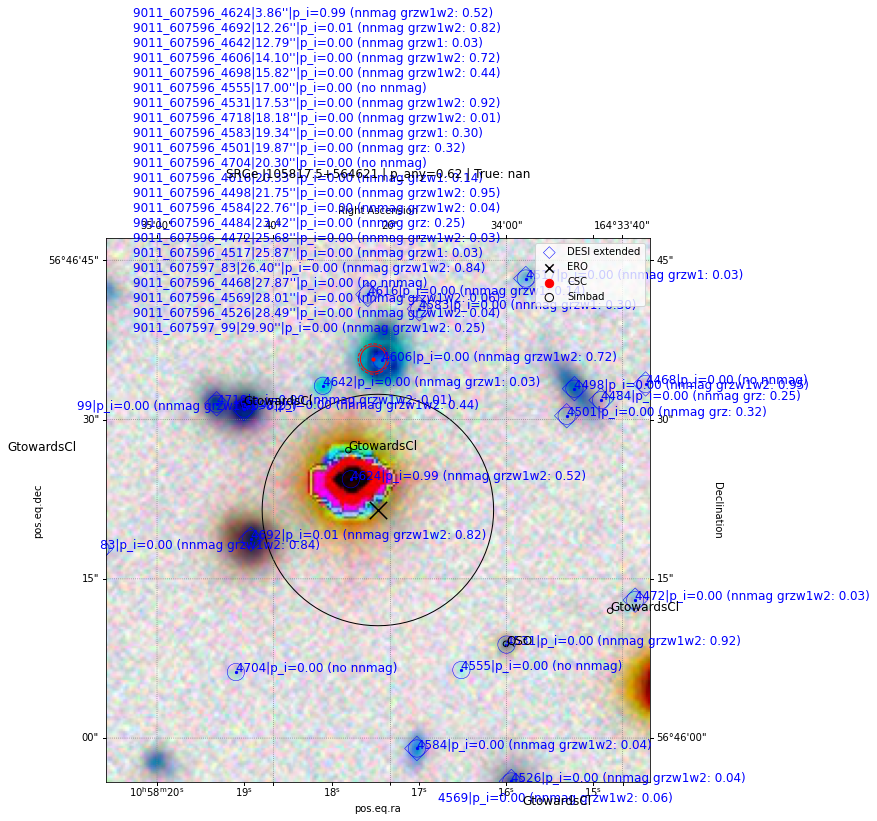

eROSITA ID: SRGe J105322.7+571514
Browser URL: https://www.legacysurvey.org/viewer/?ra=163.34454012984975&dec=57.253781490398275&zoom=16


9011_609170_3340|4.30''|p_i=1.00 (nnmag grzw1: 0.60)
9011_609170_3344|8.38''|p_i=0.00 (no nnmag)
9011_609170_3304|12.14''|p_i=0.00 (nnmag grzw1w2: 0.07)
9011_609170_3337|13.42''|p_i=0.00 (nnmag grzw1w2: 0.11)
9011_609170_3279|16.20''|p_i=0.00 (nnmag grzw1w2: 0.04)
9011_609170_3246|18.55''|p_i=0.00 (no nnmag)
9011_609170_3354|18.78''|p_i=0.00 (nnmag grzw1: 0.03)
9011_609170_3293|19.00''|p_i=0.00 (nnmag grzw1: 0.04)
9011_609170_3256|21.66''|p_i=0.00 (nnmag grzw1w2: 0.08)
9011_609170_3377|22.59''|p_i=0.00 (nnmag grz: 0.17)
9011_609170_3299|24.99''|p_i=0.00 (nnmag grzw1: 0.04)
9011_609170_3408|25.22''|p_i=0.00 (nnmag grzw1w2: 0.04)
9011_609170_3211|27.40''|p_i=0.00 (nnmag grzw1: 0.05)
9011_609170_3352|28.13''|p_i=0.00 (nnmag grz: 0.17)
9011_609170_3272|28.42''|p_i=0.00 (nnmag grz: 0.44)
9011_609170_3429|28.81''|p_i=0.00 (nnmag grzw1w2: 0.02)
2 Simbad objects are found in 38.5"

SRGe J105322.7+571514 | p_any=0.71 | True: nan



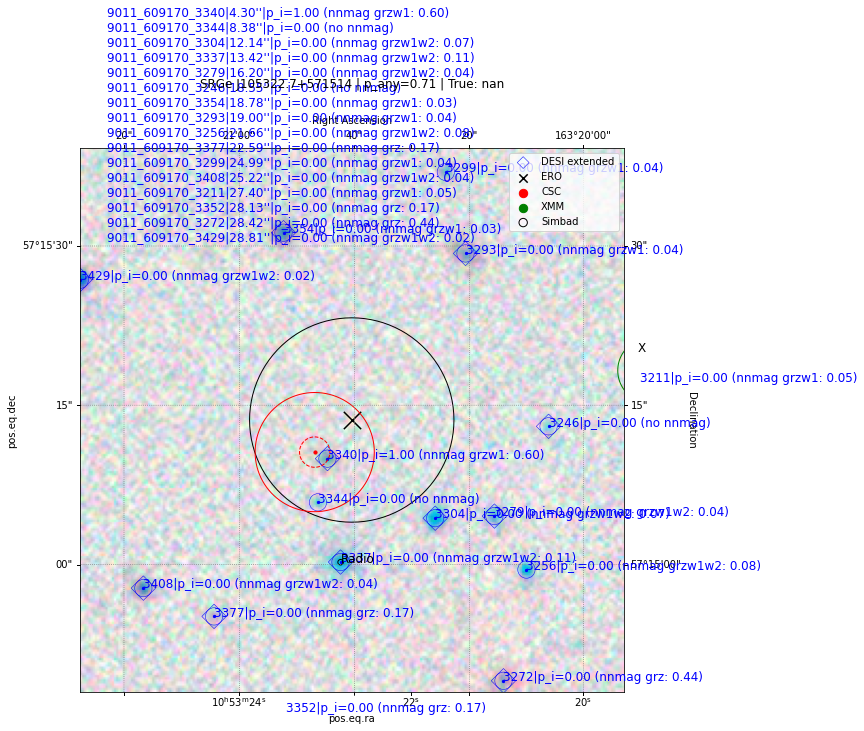

eROSITA ID: SRGe J103426.1+575524
Browser URL: https://www.legacysurvey.org/viewer/?ra=158.60880979482693&dec=57.92344012495141&zoom=16


9011_611485_1889|3.25''|p_i=0.97 (no nnmag)
9011_611485_1853|8.92''|p_i=0.03 (nnmag grzw1w2: 0.26)
9011_611485_1933|16.46''|p_i=0.00 (nnmag grz: 0.28)
9011_611485_1910|17.06''|p_i=0.00 (nnmag grzw1w2: 0.09)
9011_611485_1875|17.68''|p_i=0.00 (no nnmag)
9011_611485_1810|20.30''|p_i=0.00 (nnmag grz: 0.16)
9011_611485_1787|22.57''|p_i=0.00 (nnmag grz: 0.19)
9011_611485_1961|24.33''|p_i=0.00 (nnmag grz: 0.67)
9011_611485_1812|27.77''|p_i=0.00 (nnmag grzw1: 0.04)
9011_611485_1778|27.90''|p_i=0.00 (nnmag grzw1w2: 0.03)
9011_611485_1976|27.98''|p_i=0.00 (nnmag grzw1w2: 0.09)
9011_611485_1878|28.80''|p_i=0.00 (nnmag grz: 0.11)
9011_611485_1902|29.18''|p_i=0.00 (no nnmag)
9011_611485_1983|29.34''|p_i=0.00 (no nnmag)
2 Simbad objects are found in 37.8"

SRGe J103426.1+575524 | p_any=0.44 | True: nan



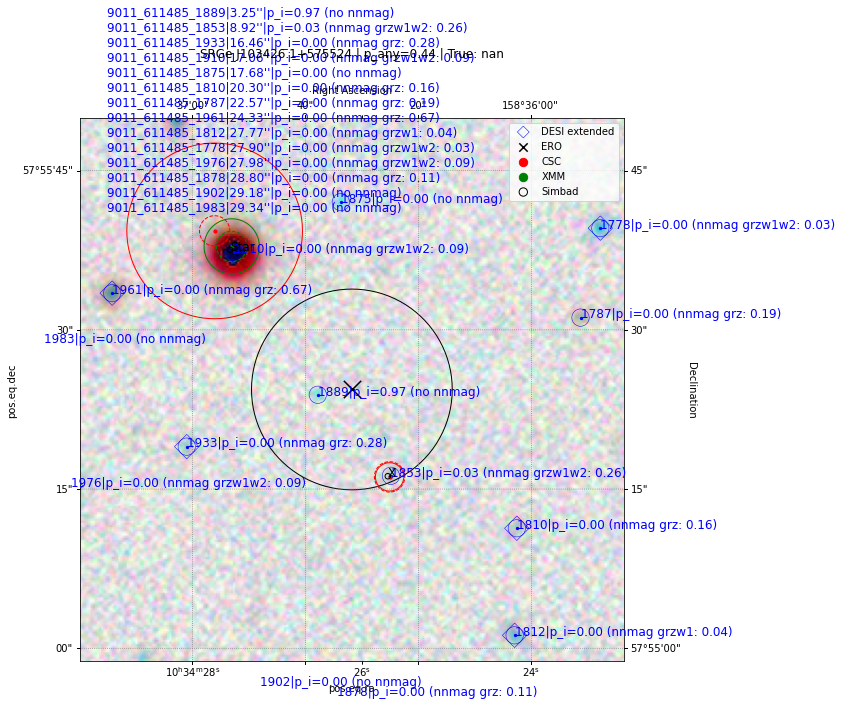

In [14]:
desi_plot("SRGe J105817.5+564621");
desi_plot("SRGe J105322.7+571514");
desi_plot("SRGe J103426.1+575524");




eROSITA ID: SRGe J103343.6+601006
Browser URL: https://www.legacysurvey.org/viewer/?ra=158.43160283624127&dec=60.168375332850914&zoom=16


/Users/sdbykov/opt/miniconda3/envs/venv_hea/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '10:33:43.5846807 +60:10:06.15119826': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


9011_618171_3404|6.33''|p_i=1.00 (nnmag grzw1: 0.55)
9011_618171_3379|10.47''|p_i=0.00 (nnmag grzw1: 0.02)
9011_618171_3365|14.54''|p_i=0.00 (no nnmag)
9011_618171_3424|16.37''|p_i=0.00 (nnmag grzw1: 0.06)
9011_618171_3374|16.89''|p_i=0.00 (nnmag grzw1w2: 0.50)
9011_618172_32|19.28''|p_i=0.00 (nnmag grzw1: 0.52)
9011_618171_3360|19.87''|p_i=0.00 (nnmag grzw1: 0.07)
9011_618171_3305|20.68''|p_i=0.00 (nnmag grz: 0.15)

SRGe J103343.6+601006 | p_any=0.47 | True: nan



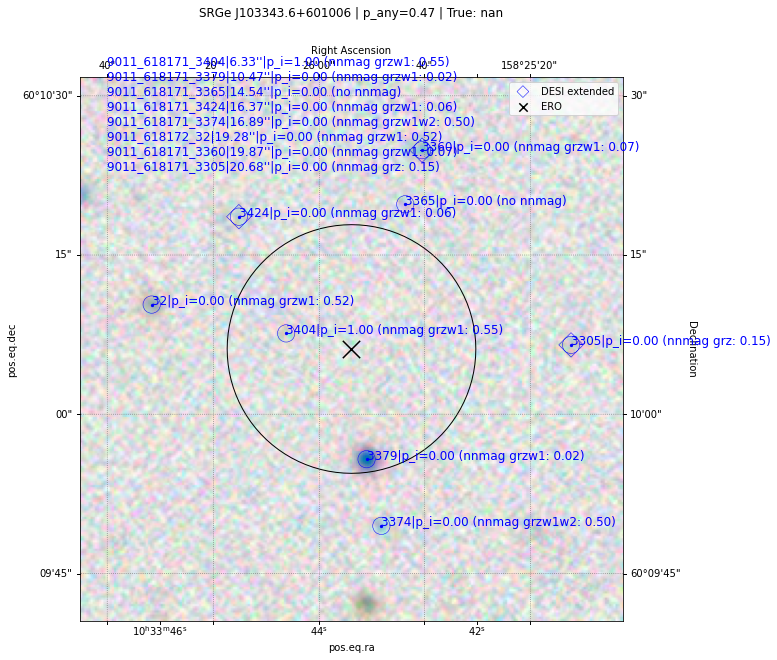

eROSITA ID: SRGe J105647.3+574635
Browser URL: https://www.legacysurvey.org/viewer/?ra=164.19728162411292&dec=57.77648877065436&zoom=16


/Users/sdbykov/opt/miniconda3/envs/venv_hea/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '10:56:47.34758979 +57:46:35.35957436': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


9011_610728_381|6.22''|p_i=0.99 (nnmag grzw1w2: 0.20)
9011_610728_384|11.17''|p_i=0.01 (no nnmag)
9011_610728_361|11.21''|p_i=0.00 (no nnmag)
9011_610728_432|12.58''|p_i=0.00 (nnmag grz: 0.18)
9011_610728_399|13.85''|p_i=0.00 (nnmag grzw1w2: 0.44)
9011_610728_446|14.14''|p_i=0.00 (nnmag grz: 0.07)
9011_610728_459|16.64''|p_i=0.00 (nnmag grzw1: 0.03)

SRGe J105647.3+574635 | p_any=0.08 | True: nan



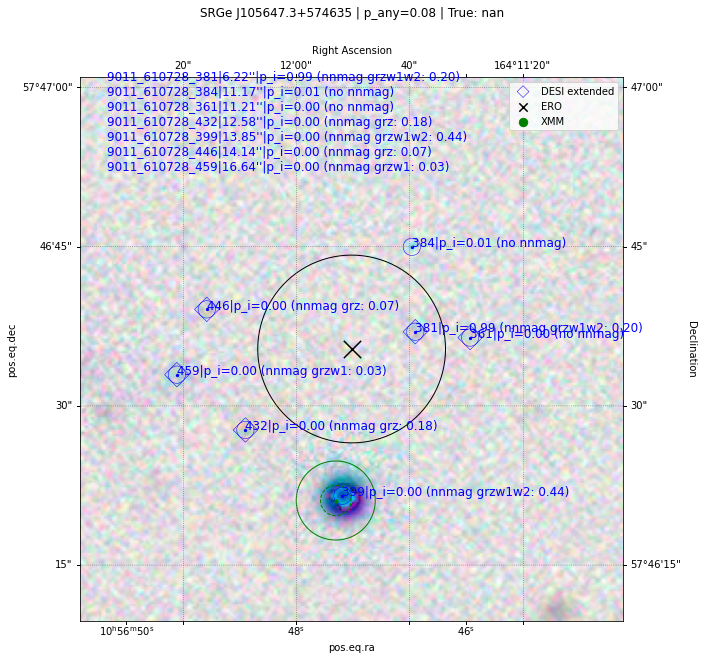

eROSITA ID: SRGe J105320.4+574011
Browser URL: https://www.legacysurvey.org/viewer/?ra=163.33493771020903&dec=57.669678606748505&zoom=16


9011_610726_985|9.78''|p_i=1.00 (no nnmag)
9011_610726_1054|15.78''|p_i=0.00 (nnmag grzw1w2: 0.45)
9011_610726_940|18.08''|p_i=0.00 (nnmag grzw1: 0.14)
9011_610726_967|18.26''|p_i=0.00 (nnmag grz: 0.21)
1 Simbad objects are found in 18.6"

SRGe J105320.4+574011 | p_any=0.00 | True: nan



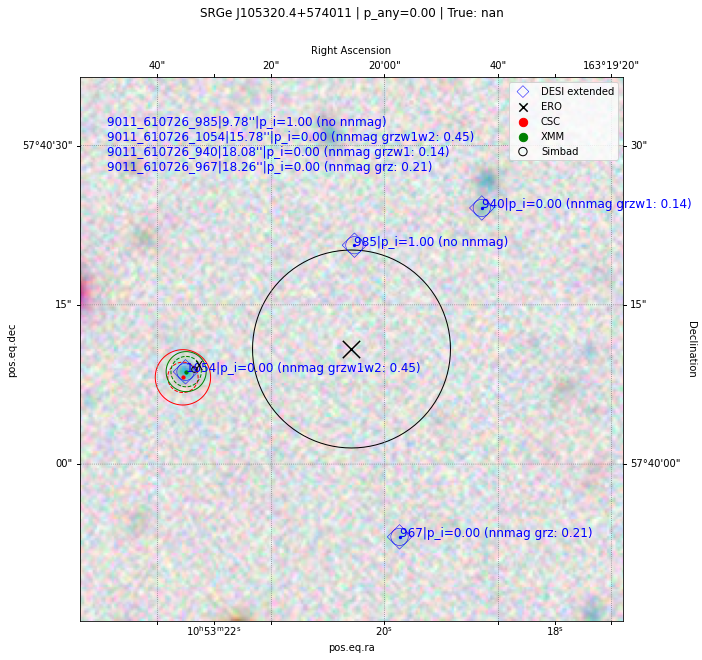

eROSITA ID: SRGe J105400.9+580039
Browser URL: https://www.legacysurvey.org/viewer/?ra=163.50360260069593&dec=58.010743571238436&zoom=16


/Users/sdbykov/opt/miniconda3/envs/venv_hea/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '10:54:00.86462417 +58:00:38.67685646': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


9011_611495_3469|1.35''|p_i=0.81 (nnmag grz: 0.33)
9011_611495_3457|3.49''|p_i=0.19 (nnmag grz: 0.15)
9011_611495_3494|12.34''|p_i=0.00 (nnmag grzw1: 0.04)
9011_611495_3460|15.20''|p_i=0.00 (nnmag grzw1w2: 0.03)
9011_611495_3415|18.52''|p_i=0.00 (no nnmag)

SRGe J105400.9+580039 | p_any=0.65 | True: nan



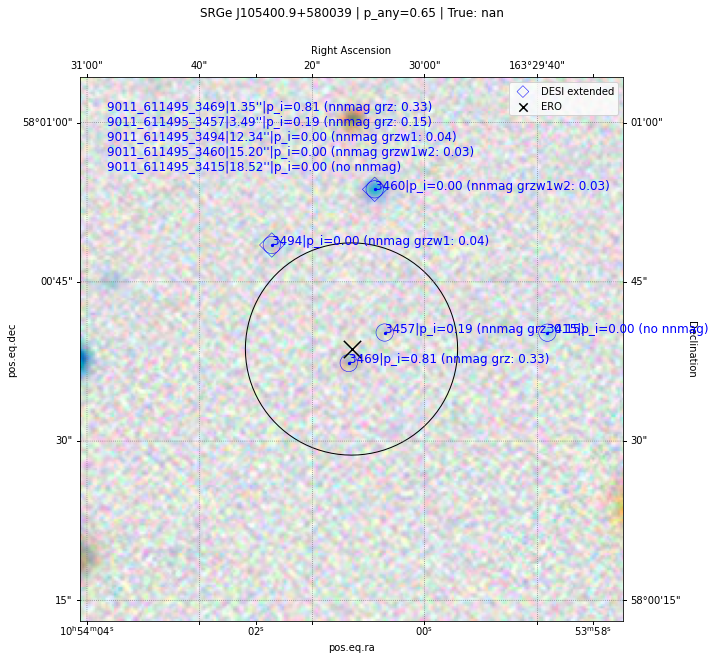

eROSITA ID: SRGe J105055.4+580247
Browser URL: https://www.legacysurvey.org/viewer/?ra=162.7307918141256&dec=58.0463924298659&zoom=16


/Users/sdbykov/opt/miniconda3/envs/venv_hea/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '10:50:55.39003539 +58:02:47.01274752': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


9011_611494_1008|4.11''|p_i=1.00 (no nnmag)
9011_611494_994|14.83''|p_i=0.00 (nnmag grzw1: 0.12)
9011_611494_1002|15.45''|p_i=0.00 (nnmag grz: 0.57)
9011_611494_1016|17.16''|p_i=0.00 (nnmag grz: 0.55)
9011_611494_1038|19.00''|p_i=0.00 (no nnmag)

SRGe J105055.4+580247 | p_any=0.21 | True: nan



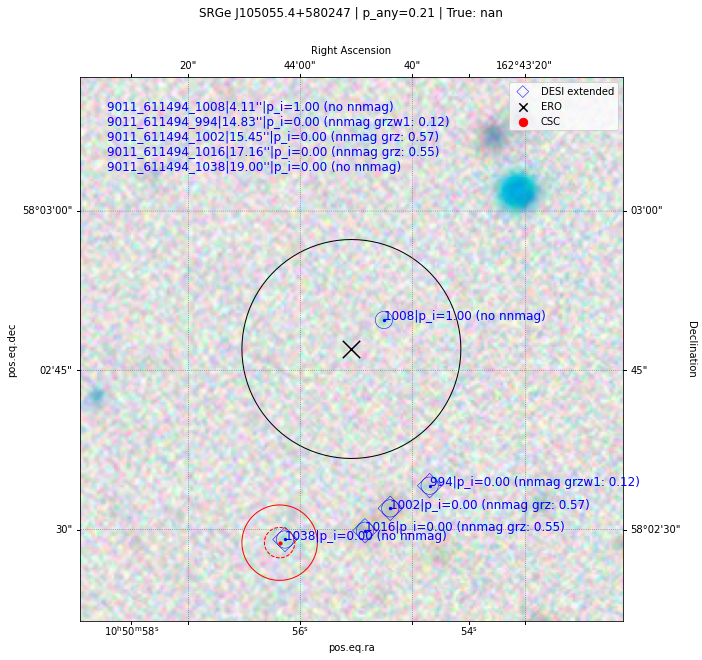

eROSITA ID: SRGe J104935.1+583825
Browser URL: https://www.legacysurvey.org/viewer/?ra=162.39637897293974&dec=58.64016159903142&zoom=16


9011_613770_1043|12.42''|p_i=0.99 (nnmag grzw1: 0.04)
9011_613770_1111|20.24''|p_i=0.01 (nnmag grz: 0.08)
9011_613770_984|24.62''|p_i=0.00 (nnmag grz: 0.24)
9011_613770_1011|26.14''|p_i=0.00 (nnmag grzw1w2: 0.90)
9011_613770_1081|26.47''|p_i=0.00 (nnmag grzw1w2: 0.03)
9011_613770_979|27.36''|p_i=0.00 (no nnmag)
9011_613770_988|28.06''|p_i=0.00 (nnmag grzw1: 0.10)
1 Simbad objects are found in 29.1"

SRGe J104935.1+583825 | p_any=0.00 | True: nan



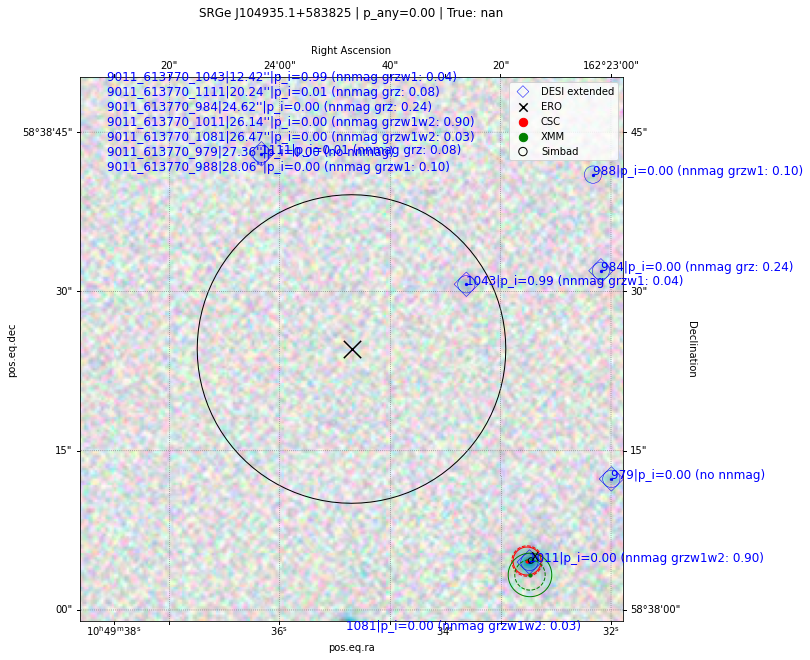

eROSITA ID: SRGe J104858.5+590824
Browser URL: https://www.legacysurvey.org/viewer/?ra=162.24379155776026&dec=59.14013310719319&zoom=16


9011_615261_1858|6.81''|p_i=0.95 (nnmag grz: 0.14)
9011_615261_1883|10.76''|p_i=0.02 (nnmag grzw1w2: 0.05)
9011_615261_1818|12.09''|p_i=0.01 (no nnmag)
9011_615261_1926|14.83''|p_i=0.00 (nnmag grz: 0.15)
9011_615261_1795|14.90''|p_i=0.00 (nnmag grzw1w2: 0.19)
9011_615261_1796|15.24''|p_i=0.01 (nnmag grzw1w2: 0.89)
9011_615261_1857|15.84''|p_i=0.00 (nnmag grz: 0.22)
9011_615261_1901|19.45''|p_i=0.00 (nnmag grz: 0.06)
9011_615261_1834|20.09''|p_i=0.00 (no nnmag)
9011_615261_1895|20.35''|p_i=0.00 (nnmag grzw1w2: 0.30)
9011_615261_1881|20.36''|p_i=0.00 (no nnmag)
9011_615261_1890|20.57''|p_i=0.00 (nnmag grz: 0.06)
2 Simbad objects are found in 20.8"

SRGe J104858.5+590824 | p_any=0.06 | True: nan



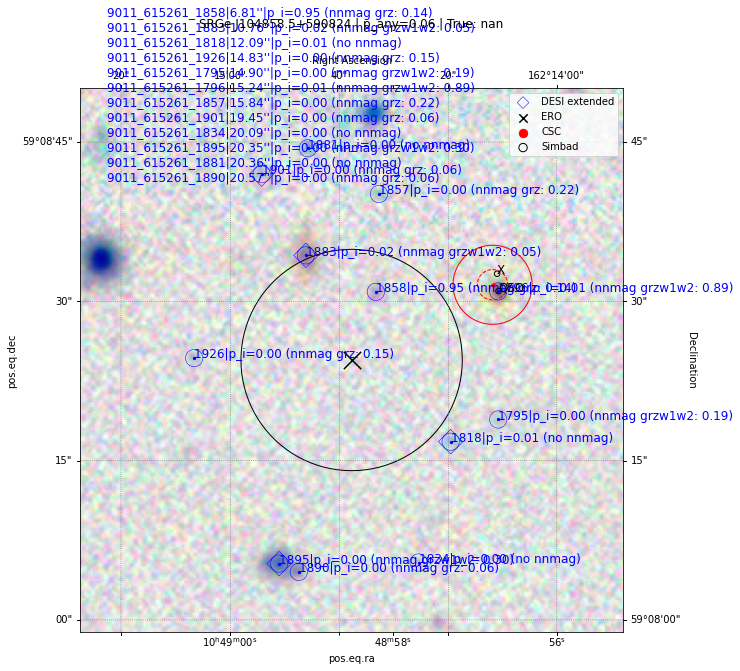

eROSITA ID: SRGe J104431.8+593242
Browser URL: https://www.legacysurvey.org/viewer/?ra=161.1324515350353&dec=59.545136171121065&zoom=16


/Users/sdbykov/opt/miniconda3/envs/venv_hea/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '10:44:31.78836841 +59:32:42.49021604': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


9011_615996_2213|10.70''|p_i=0.89 (no nnmag)
9011_615996_2162|11.05''|p_i=0.06 (no nnmag)
9011_615996_2200|12.26''|p_i=0.04 (no nnmag)
9011_615996_2231|15.03''|p_i=0.00 (nnmag grzw1w2: 0.30)
9011_615996_2144|15.24''|p_i=0.00 (nnmag grzw1: 0.03)
9011_615996_2289|15.51''|p_i=0.00 (no nnmag)

SRGe J104431.8+593242 | p_any=0.00 | True: nan



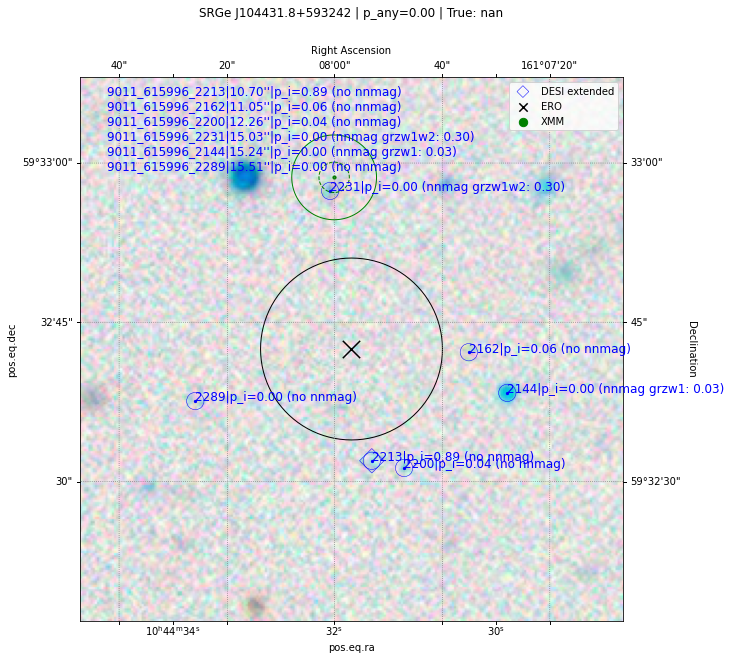

In [21]:
desi_plot = lambda  eroid: desi_image_cutout(eroid,
                ero_cat=erosita,
                desi_matched=desi_matched,
                csc_matched=csc_matched,
                xmm_matched=xmm_matched,
                nway_all_candidates=erosita_all,
                search_rad_factor=2)

desi_plot("SRGe J103343.6+601006");
desi_plot('SRGe J105647.3+574635')
desi_plot('SRGe J105320.4+574011')
desi_plot('SRGe J105400.9+580039')
desi_plot('SRGe J105055.4+580247')
desi_plot('SRGe J104935.1+583825')
desi_plot('SRGe J104858.5+590824')
desi_plot('SRGe J104431.8+593242');


eROSITA ID: SRGe J104447.4+590632
Browser URL: https://www.legacysurvey.org/viewer/?ra=161.1974585266555&dec=59.10898568647623&zoom=16


9011_614516_176|7.85''|p_i=1.00 (nnmag grzw1w2: 0.88) (true ctps)
9011_614516_159|9.43''|p_i=0.00 (nnmag grzw1w2: 0.03)
9011_614516_155|9.45''|p_i=0.00 (nnmag grzw1: 0.02)
9011_614516_142|14.10''|p_i=0.00 (nnmag grzw1w2: 0.09)
9011_614516_172|18.45''|p_i=0.00 (no nnmag)
9011_614516_146|18.76''|p_i=0.00 (nnmag grzw1: 0.02)
9011_614516_99|19.26''|p_i=0.00 (nnmag grzw1w2: 0.02)
9011_614516_190|19.32''|p_i=0.00 (nnmag grzw1w2: 0.14)
9011_614516_201|21.52''|p_i=0.00 (nnmag grz: 0.04)
9011_614516_61|23.15''|p_i=0.00 (no nnmag)
9011_614516_56|23.88''|p_i=0.00 (nnmag grz: 0.10)
9011_614516_76|24.38''|p_i=0.00 (nnmag grzw1w2: 0.06)
9011_614516_232|24.94''|p_i=0.00 (no nnmag)
9011_614516_53|25.59''|p_i=0.00 (nnmag grzw1w2: 0.71)
5 Simbad objects are found in 27.3"

SRGe J104447.4+590632 | p_any=0.09 | True: 9011_614516_176



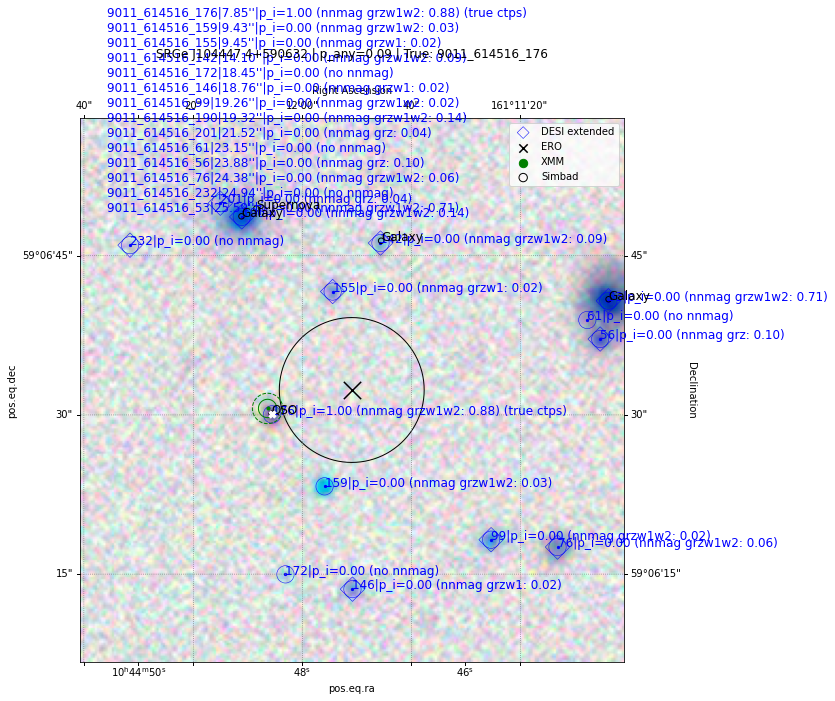

eROSITA ID: SRGe J104651.0+585524
Browser URL: https://www.legacysurvey.org/viewer/?ra=161.71230780967292&dec=58.923290005513685&zoom=16


9011_614517_352|9.37''|p_i=0.16 (nnmag grzw1w2: 0.05)
9011_614517_362|11.94''|p_i=0.12 (nnmag grzw1w2: 0.23)
9011_614517_435|12.74''|p_i=0.02 (nnmag grzw1w2: 0.08)
9011_614517_344|13.41''|p_i=0.70 (nnmag grzw1w2: 0.88) (true ctps)
9011_614517_360|14.69''|p_i=0.00 (no nnmag)
9011_614517_441|15.44''|p_i=0.00 (nnmag grzw1: 0.06)
9011_614517_321|25.12''|p_i=0.00 (no nnmag)
9011_614517_354|25.57''|p_i=0.00 (no nnmag)
9011_614517_428|25.98''|p_i=0.00 (nnmag grz: 0.03)
9011_614517_447|26.39''|p_i=0.00 (no nnmag)
9011_614517_484|26.84''|p_i=0.00 (no nnmag)
9011_614517_463|28.42''|p_i=0.00 (nnmag grzw1w2: 0.09)
9011_614517_502|29.28''|p_i=0.00 (no nnmag)
7 Simbad objects are found in 46.6"

SRGe J104651.0+585524 | p_any=0.04 | True: 9011_614517_344



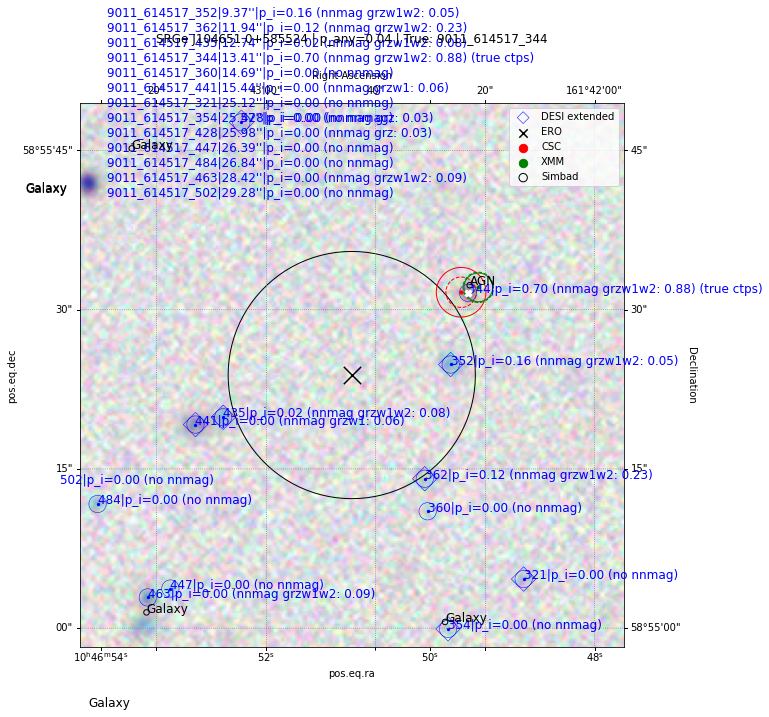

eROSITA ID: SRGe J104950.8+590804
Browser URL: https://www.legacysurvey.org/viewer/?ra=162.46176620839225&dec=59.134541435523666&zoom=16


/Users/sdbykov/opt/miniconda3/envs/venv_hea/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '10:49:50.82389001 +59:08:04.34916789': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


9011_615261_3389|3.01''|p_i=1.00 (nnmag grzw1w2: 0.69)
9011_615261_3409|8.21''|p_i=0.00 (nnmag grzw1w2: 0.66) (true ctps)
9011_615261_3351|10.62''|p_i=0.00 (nnmag grz: 0.25)
9011_615261_3326|20.92''|p_i=0.00 (nnmag grzw1w2: 0.75)
9011_615261_3295|22.38''|p_i=0.00 (nnmag grzw1w2: 0.03)
9011_615261_3470|23.94''|p_i=0.00 (nnmag grzw1: 0.05)
9011_615261_3383|23.96''|p_i=0.00 (no nnmag)
9011_615261_3291|25.51''|p_i=0.00 (nnmag grzw1w2: 0.10)

SRGe J104950.8+590804 | p_any=0.87 | True: 9011_615261_3409



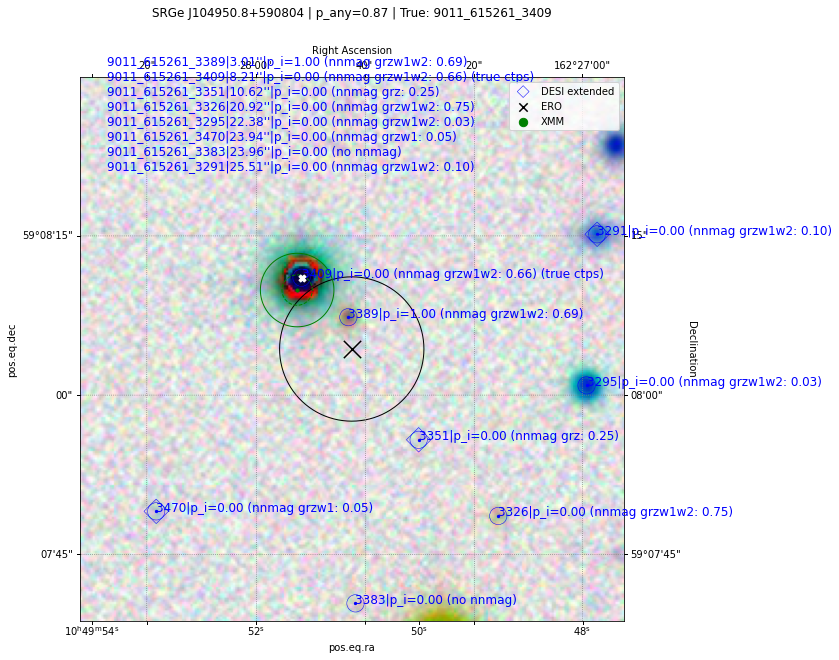

eROSITA ID: SRGe J103359.9+573932
Browser URL: https://www.legacysurvey.org/viewer/?ra=158.49938384167726&dec=57.65890424019197&zoom=16


9011_610715_3178|6.78''|p_i=0.47 (nnmag grz: 0.10)
9011_610715_3151|9.10''|p_i=0.53 (nnmag grzw1w2: 0.74) (true ctps)
9011_610715_3167|10.22''|p_i=0.00 (no nnmag)
9011_610715_3209|12.23''|p_i=0.00 (no nnmag)
9011_610715_3158|12.89''|p_i=0.00 (nnmag grz: 0.10)
9011_610715_3259|15.50''|p_i=0.00 (nnmag grzw1w2: 0.04)
9011_610715_3109|15.68''|p_i=0.00 (no nnmag)
9011_610715_3143|16.37''|p_i=0.00 (nnmag grz: 0.13)
9011_610715_3100|16.98''|p_i=0.00 (nnmag grzw1w2: 0.28)
9011_610715_3183|17.04''|p_i=0.00 (nnmag grzw1: 0.03)
9011_610715_3241|17.09''|p_i=0.00 (nnmag grz: 0.06)
9011_610715_3120|17.33''|p_i=0.00 (nnmag grzw1: 0.10)
9011_610715_3281|17.42''|p_i=0.00 (no nnmag)
9011_610715_3108|20.03''|p_i=0.00 (nnmag grz: 0.22)
9011_610715_3093|21.46''|p_i=0.00 (nnmag grz: 0.65)
9011_610715_3147|22.55''|p_i=0.00 (nnmag grz: 0.06)
9011_610715_3308|23.13''|p_i=0.00 (nnmag grz: 0.09)
9011_610715_3072|23.82''|p_i=0.00 (nnmag grzw1w2: 0.05)
9011_610715_3198|25.67''|p_i=0.00 (nnmag grzw1w2: 0.07)
9011_6

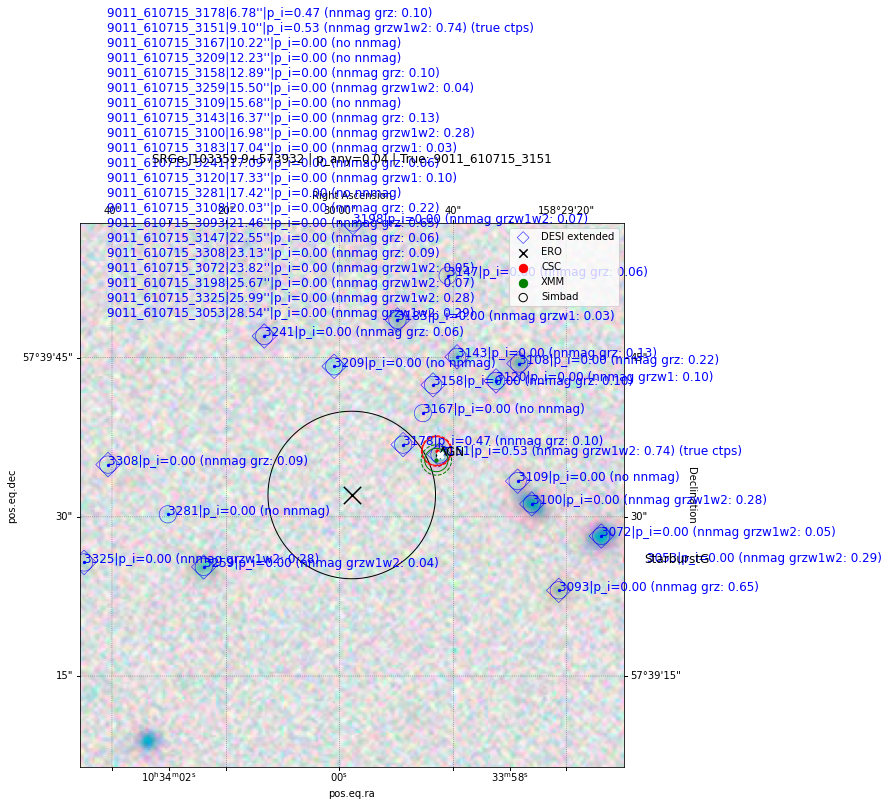

eROSITA ID: SRGe J104556.7+573140
Browser URL: https://www.legacysurvey.org/viewer/?ra=161.48644312144035&dec=57.527784294525475&zoom=16


/Users/sdbykov/opt/miniconda3/envs/venv_hea/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '10:45:56.74634915 +57:31:40.02346029': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


9011_609946_3540|3.55''|p_i=0.15 (nnmag grz: 0.19)
9011_609946_3561|3.78''|p_i=0.83 (nnmag grzw1: 0.60)
9011_609946_3526|7.30''|p_i=0.00 (nnmag grzw1w2: 0.25)
9011_609946_3558|8.11''|p_i=0.02 (nnmag grzw1w2: 0.90) (true ctps)
9011_609946_3555|8.78''|p_i=0.00 (nnmag grzw1: 0.03)
9011_609946_3568|10.22''|p_i=0.00 (nnmag grzw1w2: 0.22)
9011_609946_3566|10.88''|p_i=0.00 (nnmag grzw1: 0.31)
9011_609946_3527|11.07''|p_i=0.00 (nnmag grzw1w2: 0.19)
9011_609947_38|14.59''|p_i=0.00 (no nnmag)
9011_609947_39|15.86''|p_i=0.00 (nnmag grzw1: 0.06)
9011_609946_3511|19.66''|p_i=0.00 (nnmag grzw1: 0.30)
9011_609946_3499|20.11''|p_i=0.00 (no nnmag)
9011_609946_3513|21.89''|p_i=0.00 (nnmag grzw1: 0.19)
9011_609946_3479|22.38''|p_i=0.00 (nnmag grz: 0.20)
9011_609946_3454|25.57''|p_i=0.00 (no nnmag)

SRGe J104556.7+573140 | p_any=0.77 | True: 9011_609946_3558



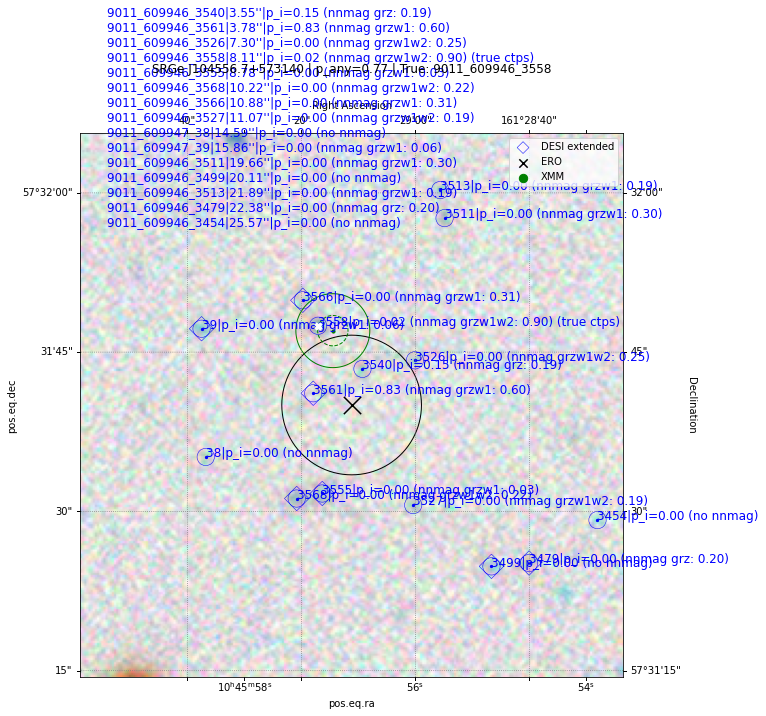

In [6]:
desi_plot = lambda  eroid: desi_image_cutout(eroid,
                ero_cat=erosita,
                desi_matched=desi_matched,
                csc_matched=csc_matched,
                xmm_matched=xmm_matched,
                nway_all_candidates=erosita_all,
                search_rad_factor=4)

desi_plot("SRGe J104447.4+590632");
desi_plot("SRGe J104651.0+585524");
desi_plot("SRGe J104950.8+590804");
desi_plot("SRGe J103359.9+573932");
desi_plot("SRGe J104556.7+573140");
#desi_plot("SRGe J104045.8+575533");



eROSITA ID: SRGe J104045.8+575533
Browser URL: https://www.legacysurvey.org/viewer/?ra=160.19091518326826&dec=57.925880687219276&zoom=16


/Users/sdbykov/opt/miniconda3/envs/venv_hea/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '10:40:45.81964398 +57:55:33.17047399': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


9011_611488_2716|0.97''|p_i=0.99 (nnmag grzw1w2: 0.13)
9011_611488_2722|7.07''|p_i=0.01 (nnmag grzw1w2: 0.60) (true ctps)
9011_611488_2686|8.44''|p_i=0.00 (nnmag grzw1w2: 0.49)
9011_611488_2688|9.55''|p_i=0.00 (nnmag grzw1w2: 0.26)
9011_611488_2694|13.90''|p_i=0.00 (nnmag grz: 0.22)
9011_611488_2665|16.67''|p_i=0.00 (nnmag grzw1w2: 0.16)
9011_611488_2770|18.12''|p_i=0.00 (nnmag grzw1w2: 0.14)
9011_611488_2765|19.17''|p_i=0.00 (no nnmag)

SRGe J104045.8+575533 | p_any=0.59 | True: 9011_611488_2722



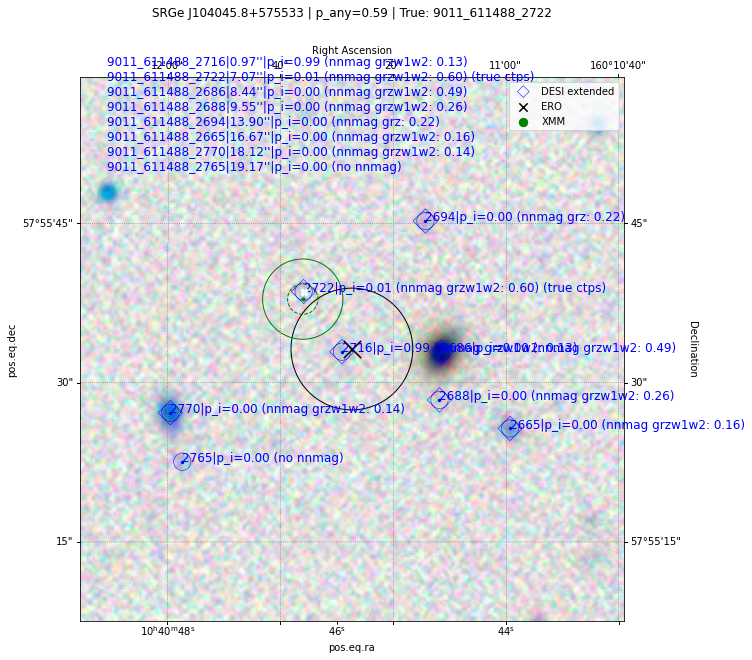

In [7]:
desi_plot("SRGe J104045.8+575533");


----

eROSITA ID: SRGe J104528.9+563049
Browser URL: https://www.legacysurvey.org/viewer/?ra=161.3705743770014&dec=56.51356514126882&zoom=16


/Users/sdbykov/opt/miniconda3/envs/venv_hea/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '10:45:28.93785048 +56:30:48.83450857': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


9011_606793_2528|3.50''|p_i=0.86 (nnmag grzw1w2: 0.23)
9011_606793_2518|6.80''|p_i=0.13 (nnmag grzw1w2: 0.32)
9011_606793_2577|9.16''|p_i=0.01 (nnmag grz: 0.16)
9011_606793_2502|11.88''|p_i=0.00 (nnmag grz: 0.38)
9011_606793_2516|15.45''|p_i=0.00 (no nnmag)
9011_606793_2472|16.11''|p_i=0.00 (no nnmag)
9011_606793_2459|18.28''|p_i=0.00 (no nnmag)

SRGe J104528.9+563049 | p_any=0.45 | True: nan



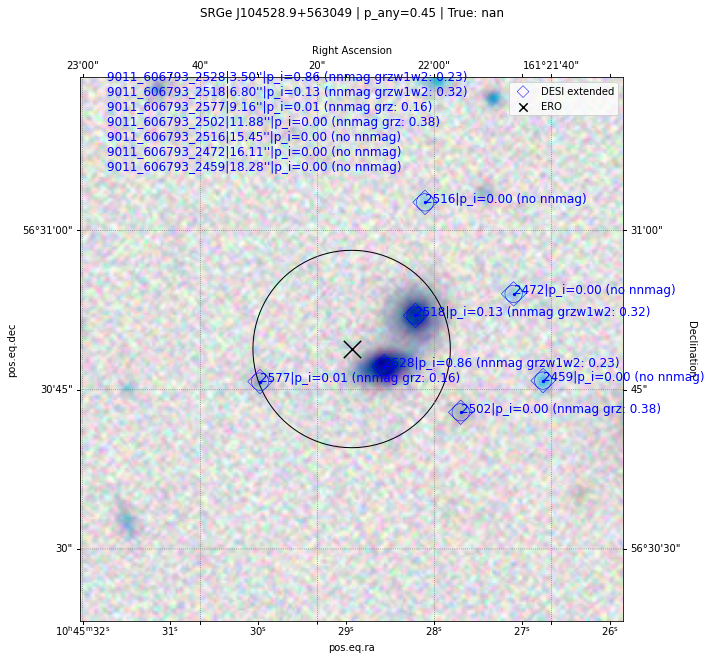

In [20]:
desi_plot('SRGe J104528.9+563049');

In [ ]:


#correct match 
desi_plot('SRGe J110612.0+585212')
#correct match, complex field
desi_plot('SRGe J103225.3+573157')

#incorrect match 
desi_plot("SRGe J103217.9+573836")
#true hostless
desi_plot('SRGe J103220.4+573211');
#false hostless
desi_plot('SRGe J104831.3+584027')

#generic example
desi_plot('SRGe J103118.8+574434');

In [ ]:
stop


# Hostless on validation

In [ ]:
# srcids = erosita.query('nway_desi_id_true_ctp=="hostless"').sort_values(by ='nway_prob_has_match', ascending = False, inplace = False).srcname_fin.values
# for srcid in srcids:
#     print(srcid)
#     fig, df = desi_plot(srcid)
#     p_any = df.nway_prob_has_match.values[0]
#     figname = f'p_any_{p_any:.2f}_{srcid}.png'
#     fig.savefig('plots/hostless_validation/'+figname)
#     plt.close('all')

All 'hostless' fields look okay (not bright stars, or obvious contradictions between XMM and Chandra).

Some counterparts found in Simbad (ignoring X-ray object) on the position of Chandra/XMM source:
* SRGe J104548.9+590827 - galaxy
* SRGe J104646.4+585616 - galaxy
* SRGe J104341.0+590023 - galaxy
* SRGe J104629.6+585941 - galaxy
* SRGe J104529.6+584425 - galaxy
* SRGe J104544.5+585020 - galaxy
* SRGe J103220.4+573211 - Starburst G
* SRGe J105008.1+572515 - Radio + Infared
* SRGe J104453.1+585450 - QSO
* SRGe J105216.2+572014 - AGN
* SRGe J103251.8+574550 - AGN


# Counterparts on validation where Nway did a mistake

In [ ]:
# srcids = erosita_all.query('~nway_desi_id_true_ctp.isna() & nway_desi_id_true_ctp!="hostless" & nway_desi_id_true_ctp!=nway_desi_id  & nway_match_flag==1').sort_values(by ='nway_prob_has_match', ascending = False, inplace = False).srcname_fin.values
# for srcid in srcids:
#     print(srcid)
#     fig, df = desi_plot(srcid)
#     p_any = df.nway_prob_has_match.values[0]
#     figname = f'p_any_{p_any:.2f}_{srcid}.png'
#     fig.savefig('plots/counterparts_validation_incorrect/'+figname)
#     plt.close('all')

# Counterparts on validation where Nway did NOT do a mistake

In [ ]:
# srcids = erosita_all.query('~nway_desi_id_true_ctp.isna() & nway_desi_id_true_ctp!="hostless" & nway_desi_id_true_ctp==nway_desi_id  & nway_match_flag==1').sort_values(by ='nway_prob_has_match', ascending = False, inplace = False).sample(15).srcname_fin.values
# for srcid in srcids:
#     print(srcid)
#     fig, df = desi_plot(srcid)
#     p_any = df.nway_prob_has_match.values[0]
#     figname = f'p_any_{p_any:.2f}_{srcid}.png'
#     fig.savefig('plots/counterparts_validation_correct/'+figname)
#     plt.close('all')